In [1]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import Dropout, Flatten, Dense, GlobalAveragePooling2D
from keras import applications
from keras import optimizers
import glob
import matplotlib.pyplot as plt
from skimage.io import imread
from keras.callbacks import ModelCheckpoint

Using TensorFlow backend.


In [8]:
img_width, img_height = 512, 512

In [9]:
# build the Xception network
base_model = applications.Xception(weights='imagenet', include_top=False,input_shape = (img_width, img_height, 3))
print('Model loaded.')

Model loaded.


In [10]:
# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# let's add a fully-connected layer
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
# and a logistic layer
predictions = Dense(6, activation='softmax')(x)

In [11]:
# this is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

In [12]:
# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

In [13]:
# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='rmsprop', loss='categorical_crossentropy')

In [15]:
# dimensions of our images.
img_width, img_height = 512, 512

weights_path = '../saved_weights/exception_weights.h5'
top_model_weights_path = '../saved_weights/bottleneck_ex_model.h5'
train_data_dir = '../../data/model/key19_cropped/train/'
validation_data_dir = '../../data/model/key19_cropped/val'
nb_train_samples = int(len(glob.glob(train_data_dir+'/*/*')))
nb_validation_samples = int(len(glob.glob(validation_data_dir+'/*/*')))
epochs = 100
batch_size = 16
print('Found {} training samples, {} validation samples'.format(nb_train_samples,nb_validation_samples))

Found 200 training samples, 84 validation samples


In [26]:
train_datagen = ImageDataGenerator(rotation_range=20,
                                    width_shift_range=0.1,
                                    height_shift_range=0.1,
                                    shear_range=0.2,
                                    zoom_range=0.05,
                                    rescale=1/255.,
                                    fill_mode='nearest',
                                    channel_shift_range=0.2*255)

validation_datagen = ImageDataGenerator(rescale=1. / 255)

In [27]:
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

Found 200 images belonging to 6 classes.


In [28]:
validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

Found 84 images belonging to 6 classes.


In [19]:
train_history = model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=10,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

Epoch 1/10
13/12 [================================] - 18s 1s/step - loss: 2.3733 - val_loss: 2.0756
Epoch 2/10
13/12 [================================] - 14s 1s/step - loss: 1.7529 - val_loss: 1.7154
Epoch 3/10
13/12 [================================] - 14s 1s/step - loss: 1.5480 - val_loss: 2.0321
Epoch 4/10
13/12 [================================] - 14s 1s/step - loss: 1.4439 - val_loss: 1.9626
Epoch 5/10
13/12 [================================] - 14s 1s/step - loss: 1.3776 - val_loss: 1.9262
Epoch 6/10
13/12 [================================] - 14s 1s/step - loss: 1.2875 - val_loss: 2.5089
Epoch 7/10
13/12 [================================] - 14s 1s/step - loss: 1.2165 - val_loss: 2.1736
Epoch 8/10
13/12 [================================] - 14s 1s/step - loss: 1.1927 - val_loss: 1.9983
Epoch 9/10
13/12 [================================] - 14s 1s/step - loss: 1.0848 - val_loss: 2.7505
Epoch 10/10
13/12 [================================] - 14s 1s/step - loss: 1.2052 - val_loss: 2.5982

In [20]:
for layer in base_model.layers[0:116]:
    layer.trainable = False

In [21]:
for layer in base_model.layers[116:]:
    layer.trainable = True

In [22]:
model.compile(loss='categorical_crossentropy', optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),metrics=['accuracy'])

In [23]:
#model.summary()

In [24]:
checkpointer = ModelCheckpoint(filepath='../saved_weights/Xception_key19_weights.hdf5', verbose=1, save_best_only=True)

In [ ]:
train_history = model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size,
    callbacks=[checkpointer])

Epoch 1/100
13/12 [================================] - 31s 2s/step - loss: 1.5496 - acc: 0.3793 - val_loss: 2.4278 - val_acc: 0.2857
Epoch 2/100
13/12 [================================] - 16s 1s/step - loss: 1.5399 - acc: 0.3329 - val_loss: 2.1750 - val_acc: 0.2619
Epoch 3/100
13/12 [================================] - 19s 1s/step - loss: 1.4378 - acc: 0.4238 - val_loss: 1.9752 - val_acc: 0.2262
Epoch 4/100
13/12 [================================] - 20s 2s/step - loss: 1.4302 - acc: 0.4579 - val_loss: 1.8929 - val_acc: 0.2143
Epoch 5/100
13/12 [================================] - 20s 2s/step - loss: 1.2971 - acc: 0.4866 - val_loss: 1.8491 - val_acc: 0.1786
Epoch 6/100
13/12 [================================] - 20s 2s/step - loss: 1.4081 - acc: 0.4463 - val_loss: 1.8251 - val_acc: 0.1190
Epoch 7/100
13/12 [================================] - 20s 2s/step - loss: 1.4572 - acc: 0.3756 - val_loss: 1.8079 - val_acc: 0.0952
Epoch 8/100
13/12 [================================] - 19s 1s/step - 

Epoch 32/100
13/12 [================================] - 19s 1s/step - loss: 1.1048 - acc: 0.5616 - val_loss: 2.0058 - val_acc: 0.1310
Epoch 33/100
13/12 [================================] - 19s 1s/step - loss: 1.2513 - acc: 0.4841 - val_loss: 2.0189 - val_acc: 0.1310
Epoch 34/100
13/12 [================================] - 19s 1s/step - loss: 1.2144 - acc: 0.5018 - val_loss: 2.0219 - val_acc: 0.1310
Epoch 35/100
13/12 [================================] - 19s 1s/step - loss: 1.2535 - acc: 0.4359 - val_loss: 2.0088 - val_acc: 0.1310
Epoch 36/100
13/12 [================================] - 19s 1s/step - loss: 1.2249 - acc: 0.4866 - val_loss: 2.0223 - val_acc: 0.1190
Epoch 37/100
13/12 [================================] - 20s 2s/step - loss: 1.2185 - acc: 0.4574 - val_loss: 2.0311 - val_acc: 0.1190
Epoch 38/100
13/12 [================================] - 17s 1s/step - loss: 1.2543 - acc: 0.4232 - val_loss: 2.0380 - val_acc: 0.1190
Epoch 39/100
13/12 [================================] - 21s 2s

In [55]:
model.load_weights('../saved_weights/Xception_key19_weights.hdf5')
model.compile(loss='categorical_crossentropy', optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),metrics=['accuracy'])

In [57]:
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=1,
    shuffle = False,
    class_mode='categorical')
train_pred_prob = model.predict_generator(train_generator,steps = nb_train_samples, verbose=1)
train_pred_labels = np.argmax(train_pred_prob, axis=-1)
acc = 1-np.sum(train_pred_labels!=train_generator.classes[:nb_train_samples])/nb_train_samples
print(acc)

Found 3185 images belonging to 6 classes.
3183/3185 [============================>.] - ETA: 0s1.0


In [58]:
idx = np.array(np.where(train_pred_labels!=train_generator.classes))
for i in range(0,idx.shape[1]):
    print('Classified as pos {}'.format(train_pred_labels[idx[0,i]]+1))
    filename = '../data/model/key19/train/'+train_generator.filenames[idx[0,i]]
    plt.figure()
    image = imread(filename)
    plt.imshow(image)
    plt.title(filename)
    plt.axis('off')
    plt.show()

In [62]:
validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=1,
    shuffle = False,
    class_mode='categorical')
val_pred_prob = model.predict_generator(validation_generator,steps = nb_validation_samples, verbose=1)
val_pred_labels = np.argmax(val_pred_prob, axis=-1)
acc = 1-np.sum(val_pred_labels!=validation_generator.classes[:nb_validation_samples])/nb_validation_samples
print(acc)

Found 637 images belonging to 6 classes.
635/637 [============================>.] - ETA: 0s0.869701726845


Classified as pos 6


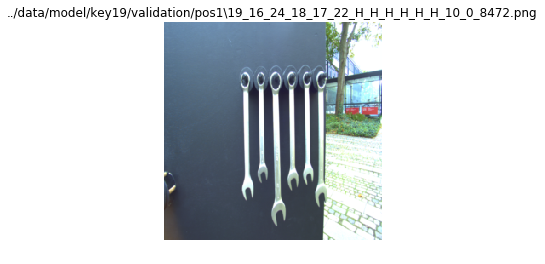

Classified as pos 6


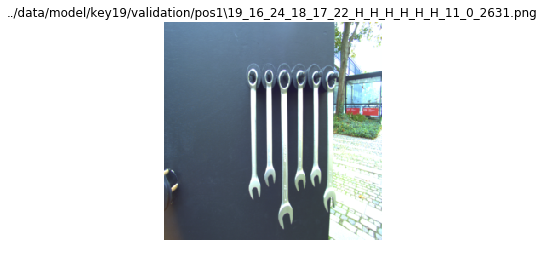

Classified as pos 6


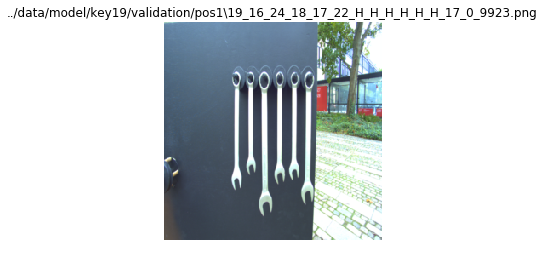

Classified as pos 6


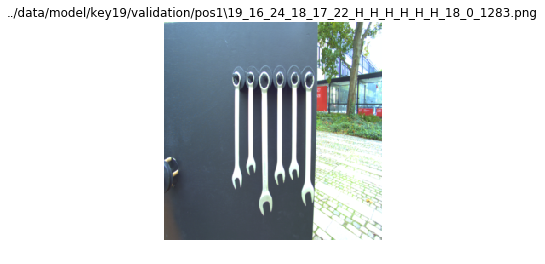

Classified as pos 6


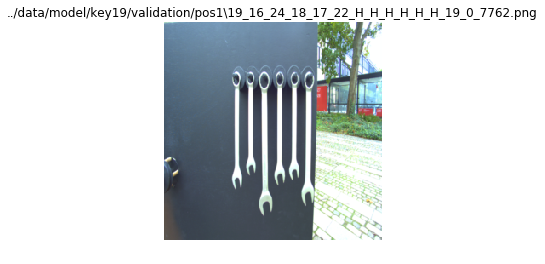

Classified as pos 6


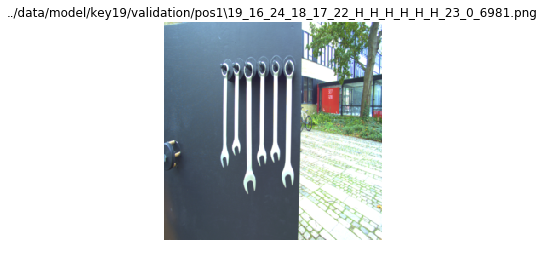

Classified as pos 6


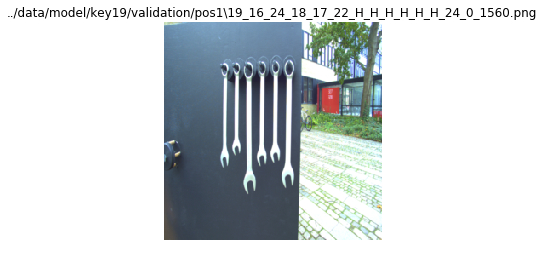

Classified as pos 4


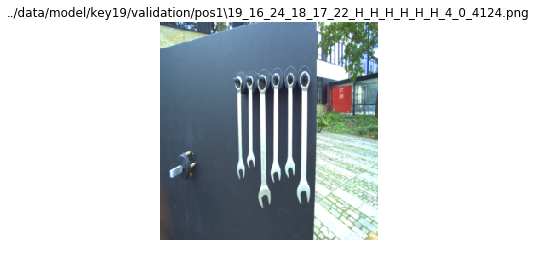

Classified as pos 4


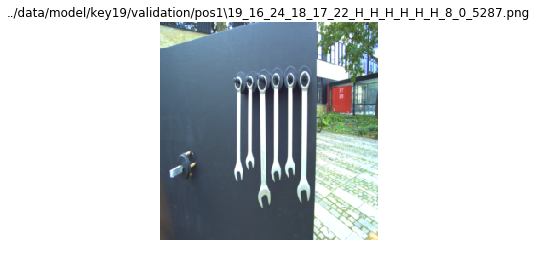

Classified as pos 3


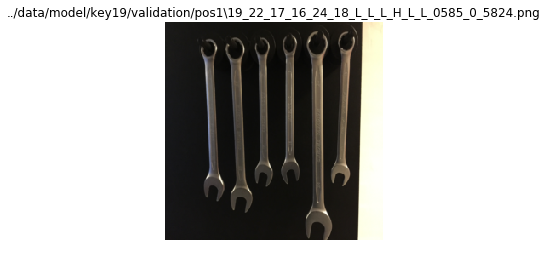

Classified as pos 2


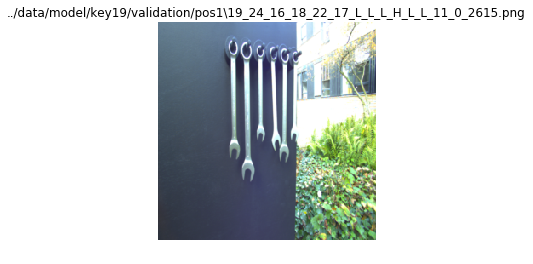

Classified as pos 2


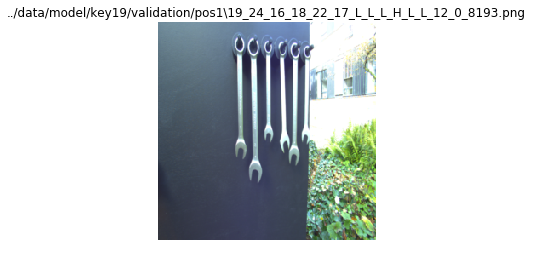

Classified as pos 2


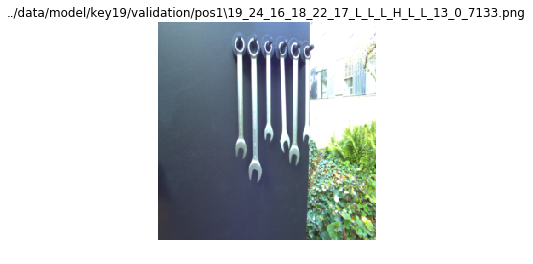

Classified as pos 3


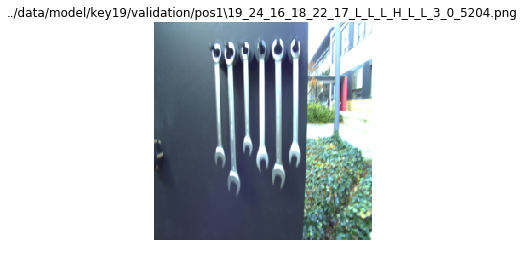

Classified as pos 6


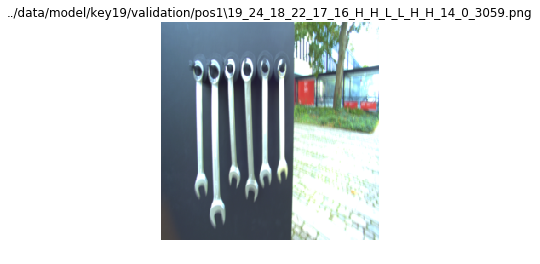

Classified as pos 6


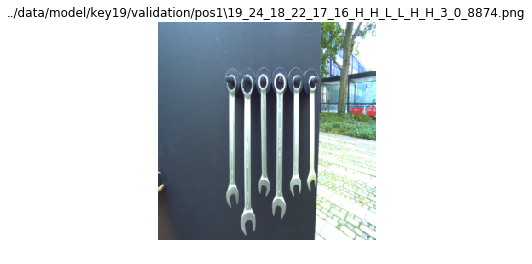

Classified as pos 6


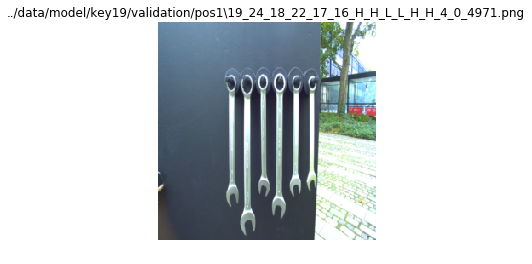

Classified as pos 6


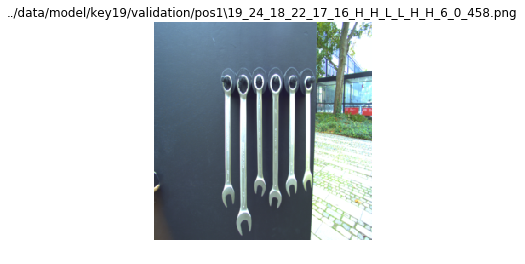

Classified as pos 6


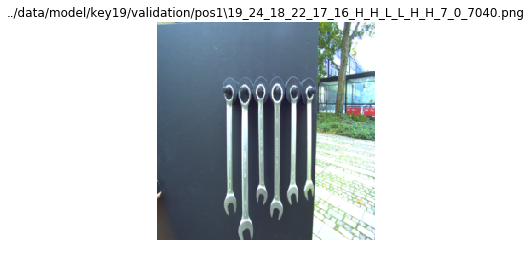

Classified as pos 6


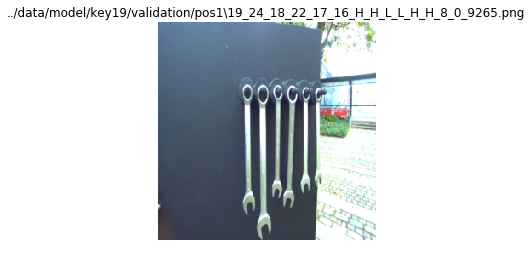

Classified as pos 4


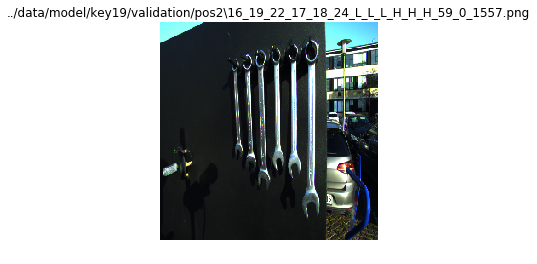

Classified as pos 4


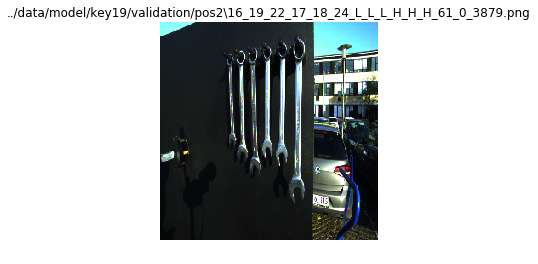

Classified as pos 4


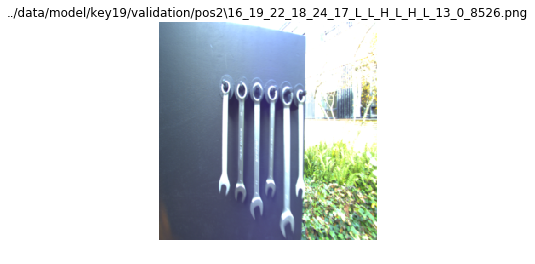

Classified as pos 4


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Classified as pos 4


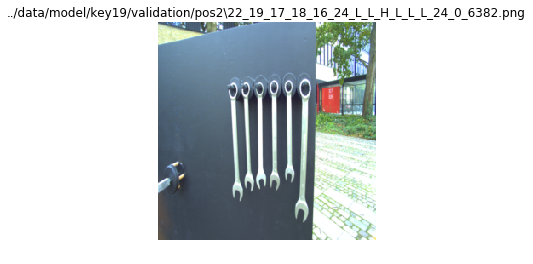

Classified as pos 4


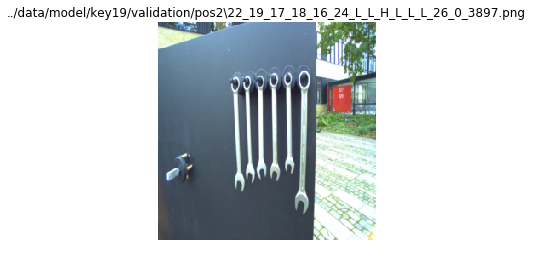

Classified as pos 4


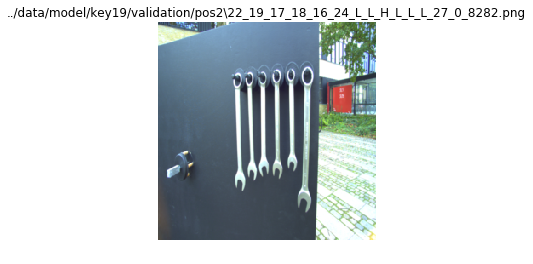

Classified as pos 4


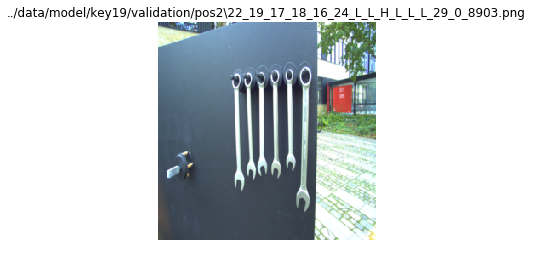

Classified as pos 4


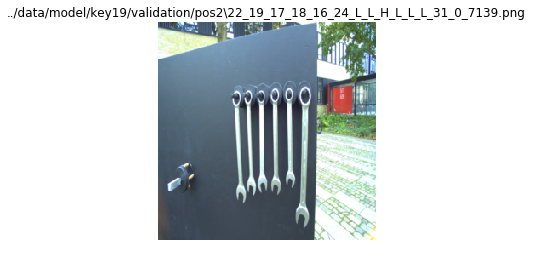

Classified as pos 4


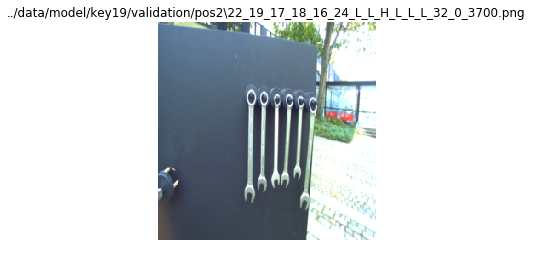

Classified as pos 4


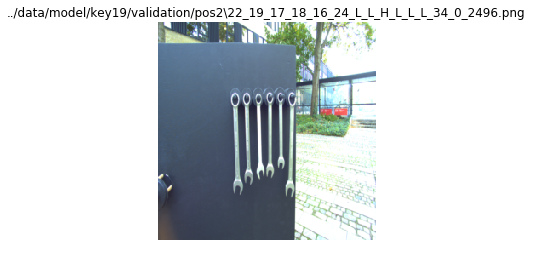

Classified as pos 4


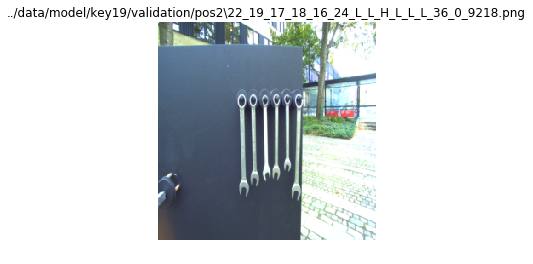

Classified as pos 4


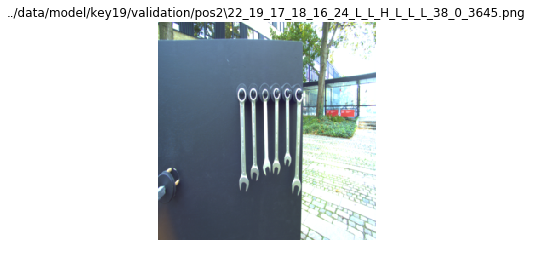

Classified as pos 4


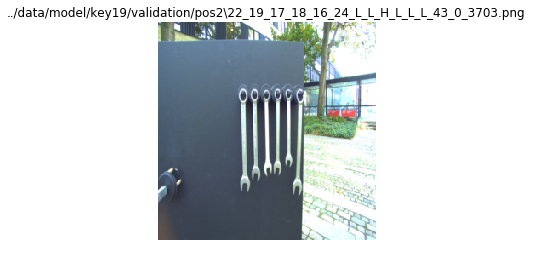

Classified as pos 5


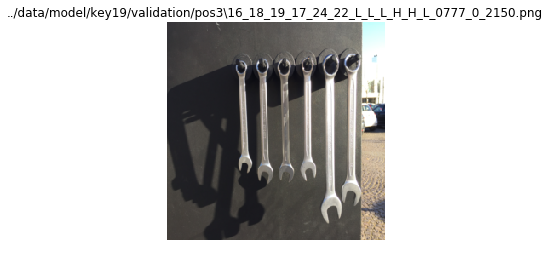

Classified as pos 6


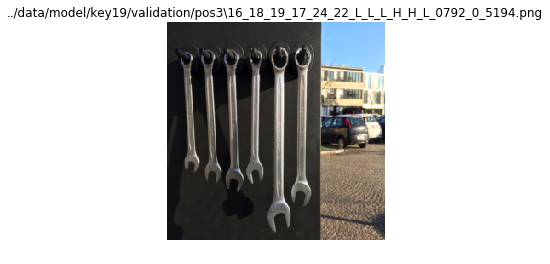

Classified as pos 2


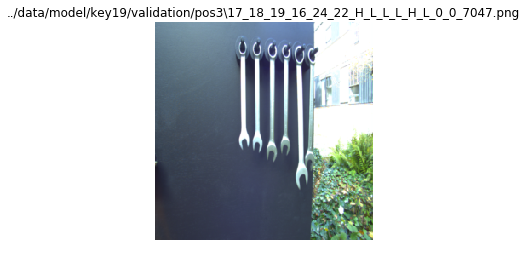

Classified as pos 4


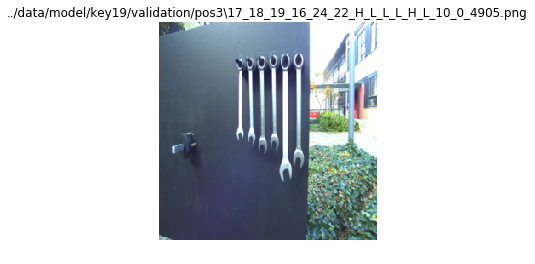

Classified as pos 2


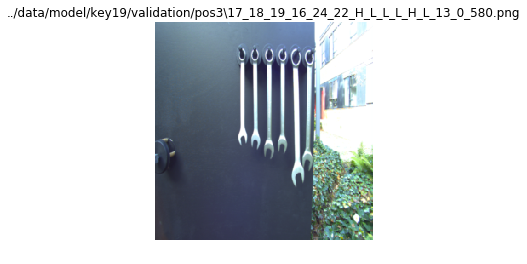

Classified as pos 2


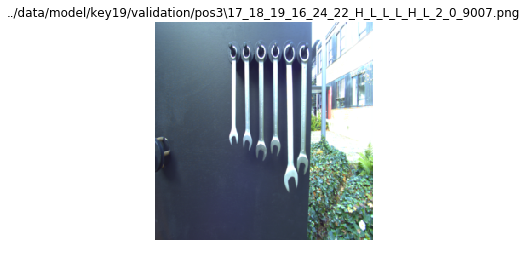

Classified as pos 2


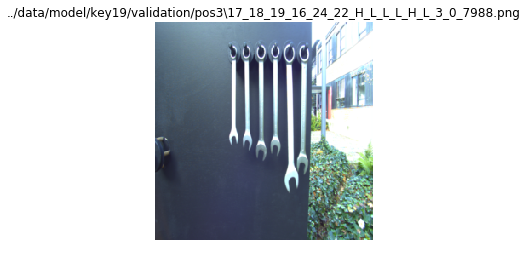

Classified as pos 4


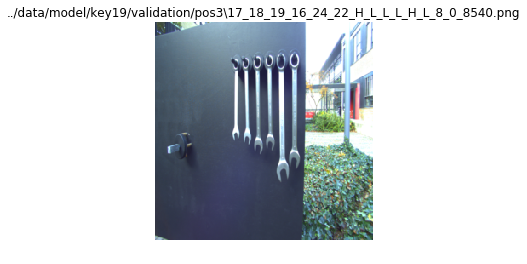

Classified as pos 6


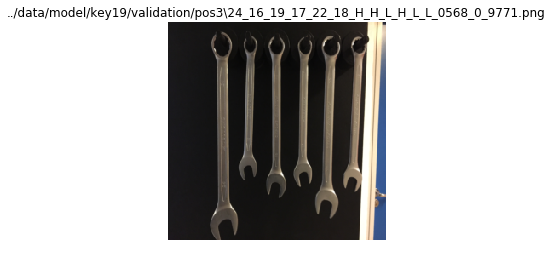

Classified as pos 6


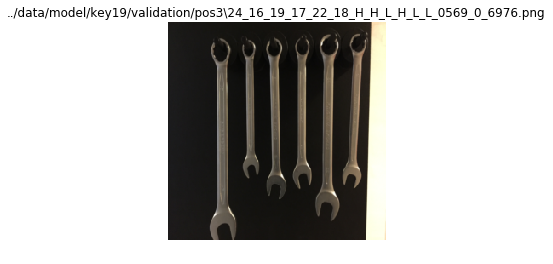

Classified as pos 2


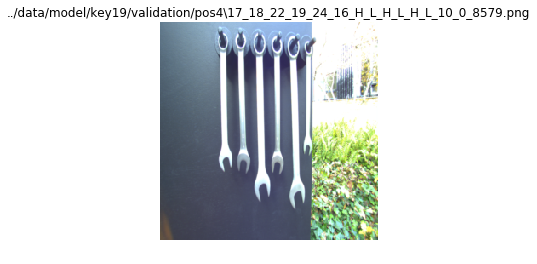

Classified as pos 2


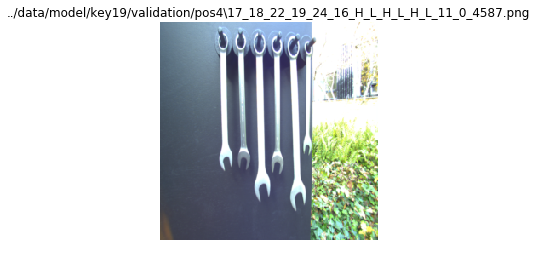

Classified as pos 2


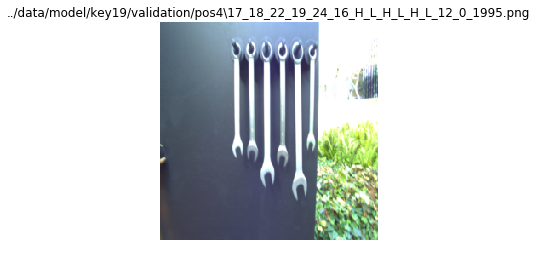

Classified as pos 6


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Classified as pos 2


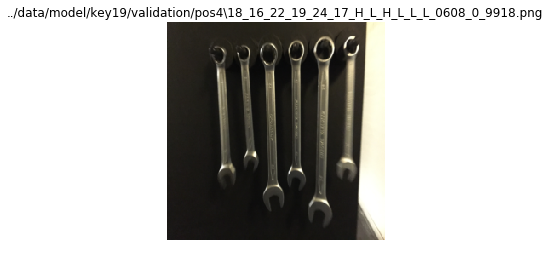

Classified as pos 5


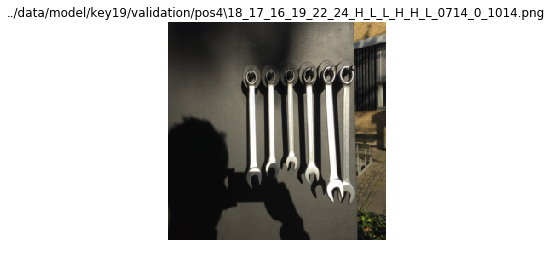

Classified as pos 5


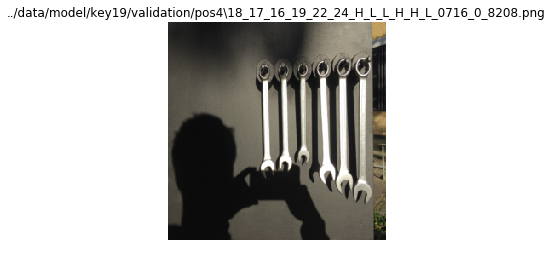

Classified as pos 6


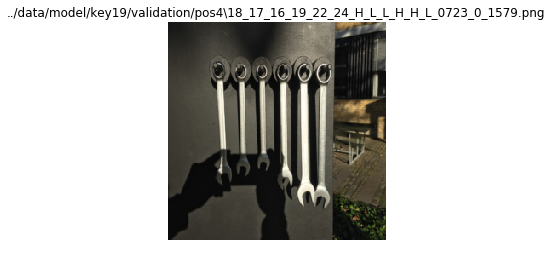

Classified as pos 2


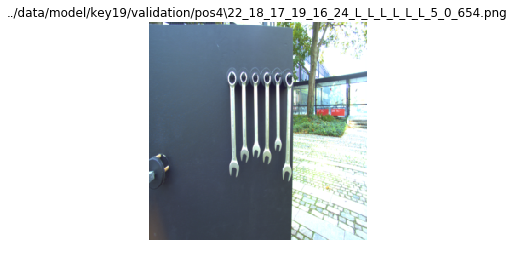

Classified as pos 2


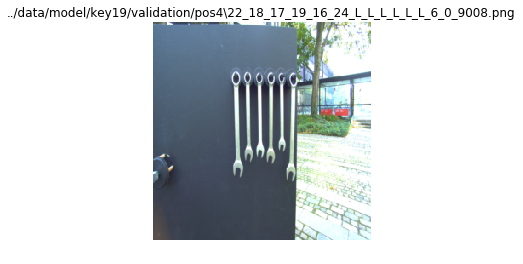

Classified as pos 5


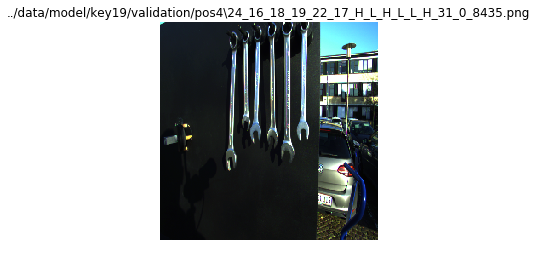

Classified as pos 4


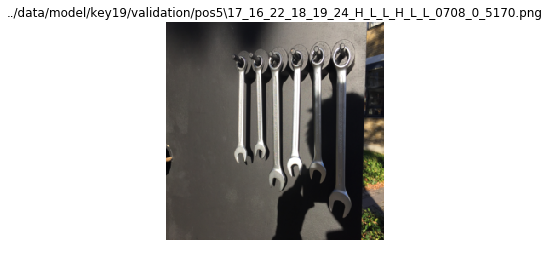

Classified as pos 1


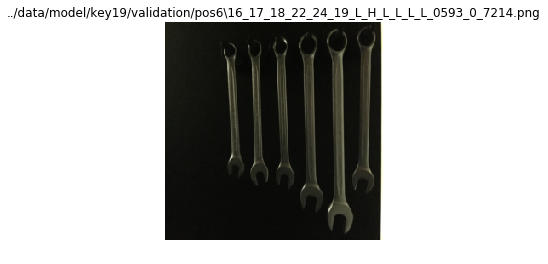

Classified as pos 5


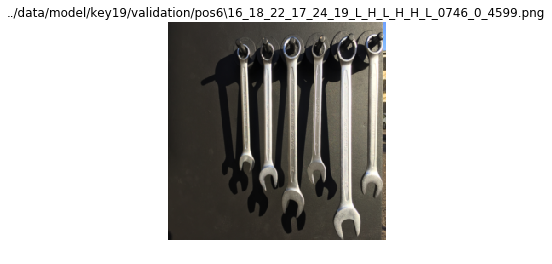

Classified as pos 2


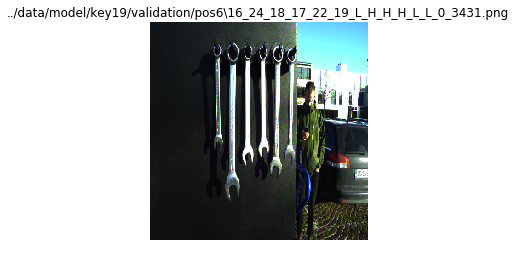

Classified as pos 4


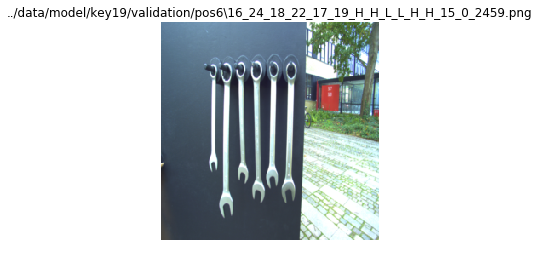

Classified as pos 2


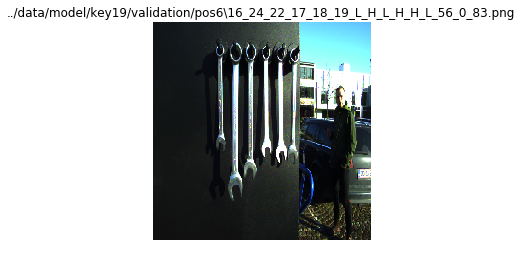

Classified as pos 1


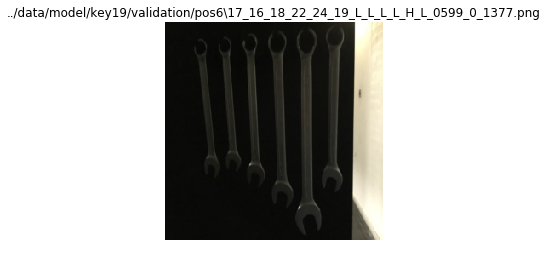

Classified as pos 4


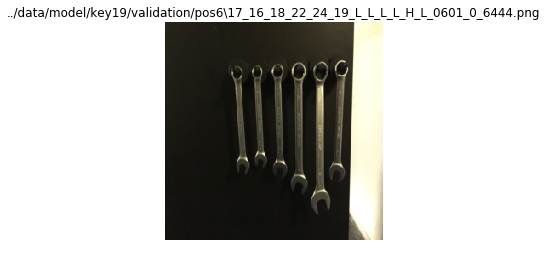

Classified as pos 5


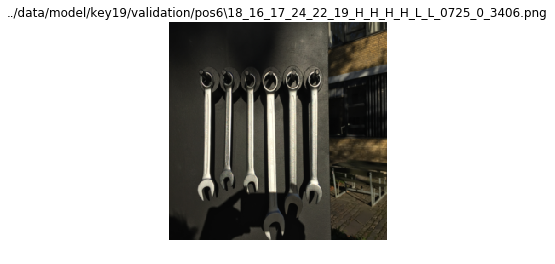

Classified as pos 1


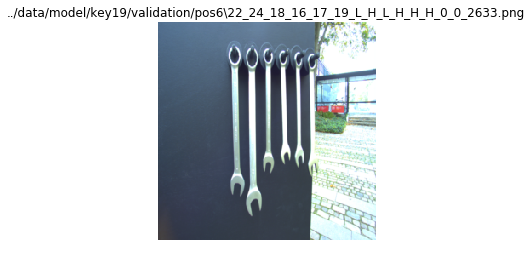

Classified as pos 1


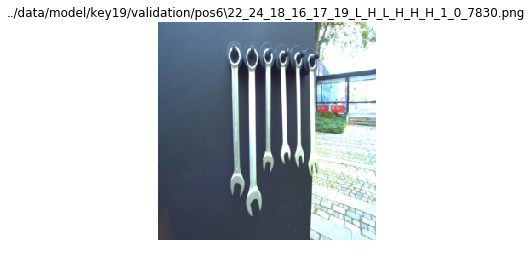

Classified as pos 1


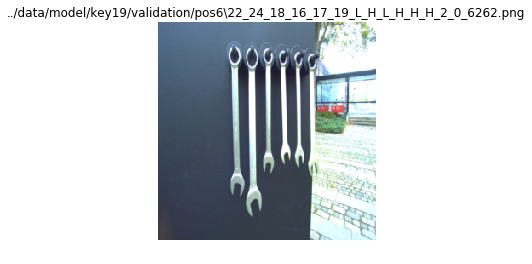

Classified as pos 1


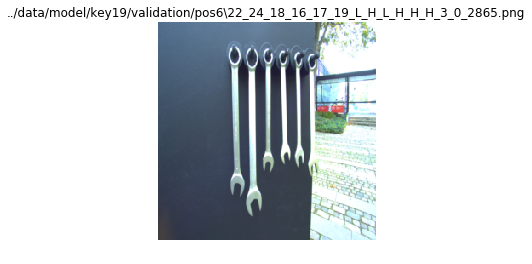

Classified as pos 2


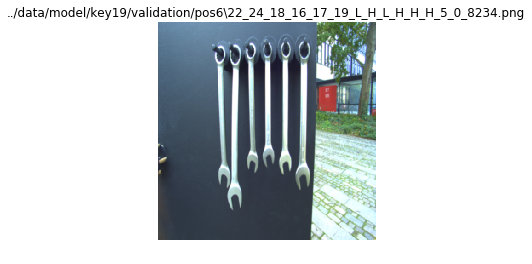

Classified as pos 2


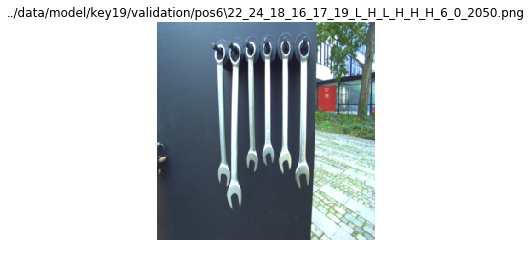

Classified as pos 2


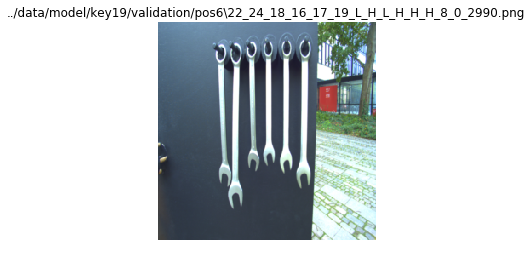

Classified as pos 2


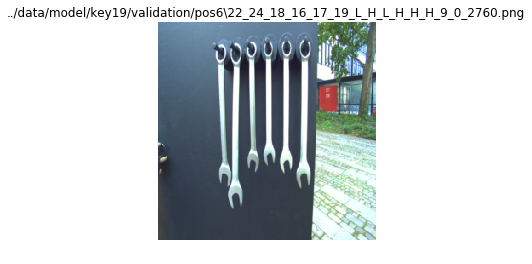

In [77]:
idx = np.array(np.where(val_pred_labels!=validation_generator.classes))
for i in range(0,idx.shape[1]):
    print('Classified as pos {}'.format(val_pred_labels[idx[0,i]]+1))
    filename = '../data/model/key19/validation/'+validation_generator.filenames[idx[0,i]]
    plt.figure()
    image = imread(filename)
    plt.imshow(image)
    plt.title(filename)
    plt.axis('off')
    plt.show()
    

In [78]:
test_datagen = ImageDataGenerator(rescale=1. / 255)
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=1,
    shuffle = False,
    class_mode='categorical')
test_pred_prob = model.predict_generator(test_generator,steps = nb_test_samples, verbose=1)
test_pred_labels = np.argmax(test_pred_prob, axis=-1)
acc = 1-np.sum(test_pred_labels!=test_generator.classes[:nb_test_samples])/nb_test_samples
print(acc)

Found 127 images belonging to 6 classes.
125/127 [============================>.] - ETA: 0s0.637795275591


Classified as pos 6


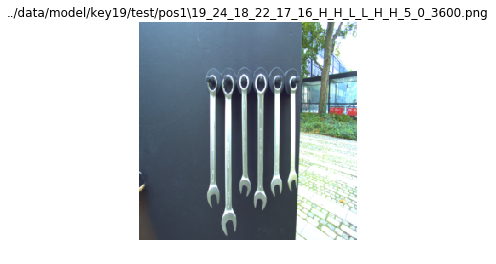

Classified as pos 5


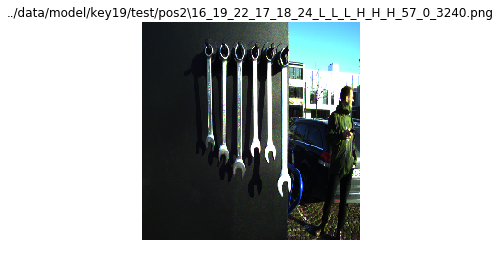

Classified as pos 5


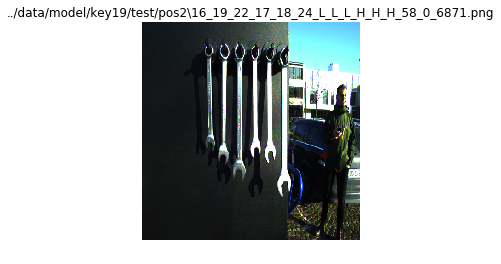

Classified as pos 5


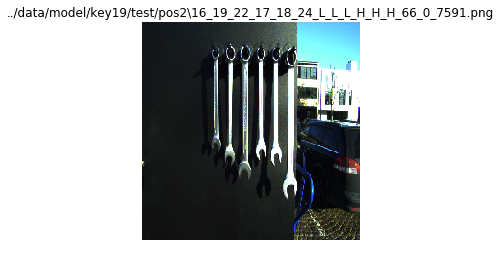

Classified as pos 6


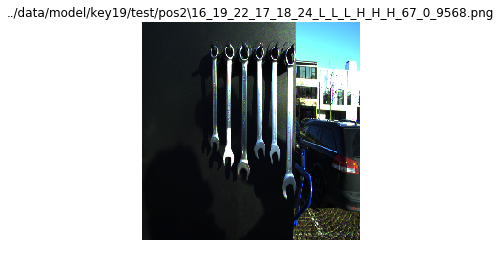

Classified as pos 6


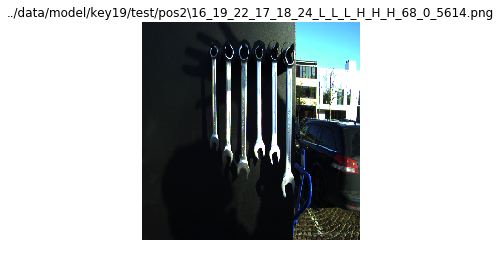

Classified as pos 5


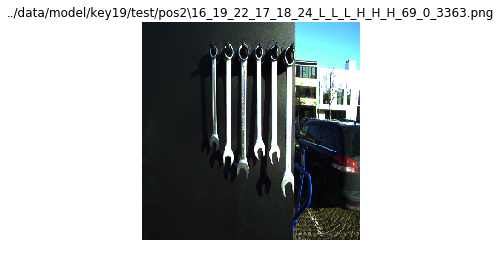

Classified as pos 6


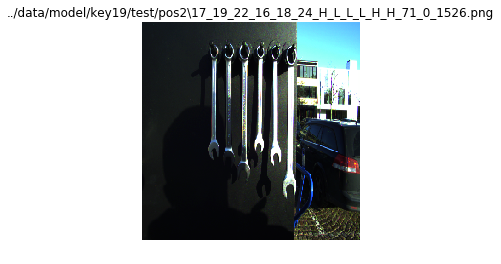

Classified as pos 6


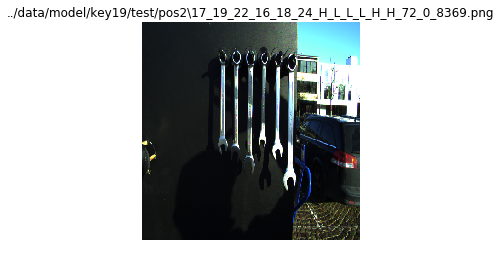

Classified as pos 6


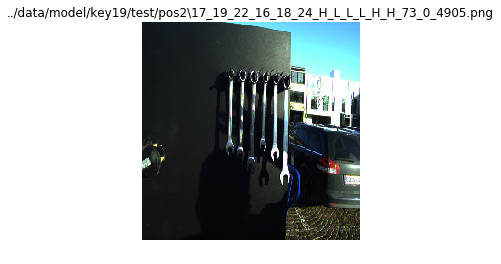

Classified as pos 6


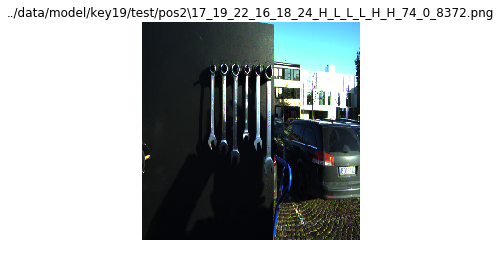

Classified as pos 6


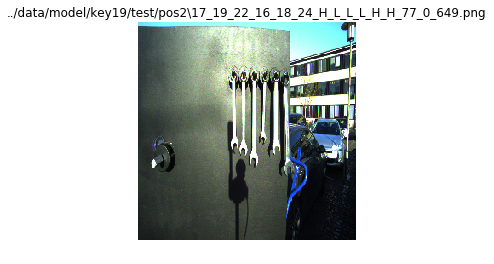

Classified as pos 6


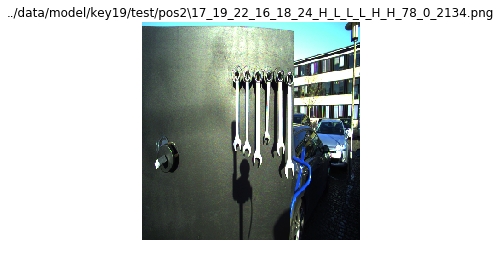

Classified as pos 4


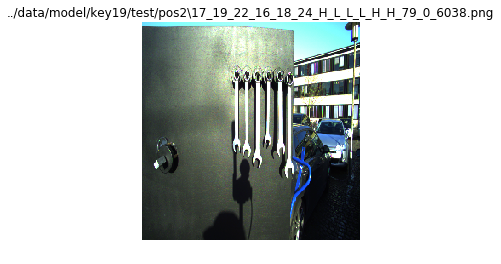

Classified as pos 4


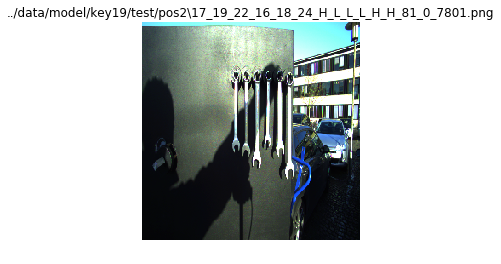

Classified as pos 5


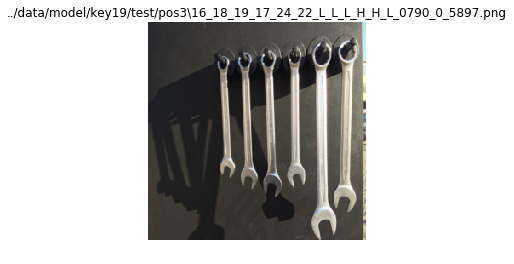

Classified as pos 2


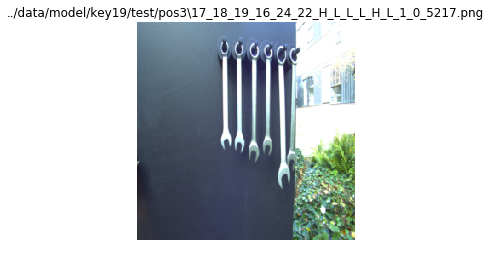

Classified as pos 4


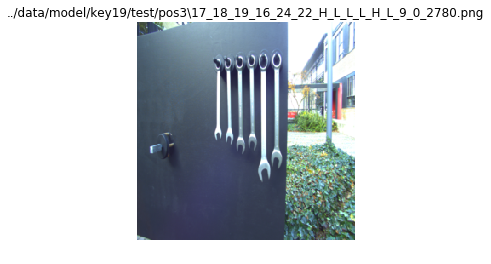

Classified as pos 6


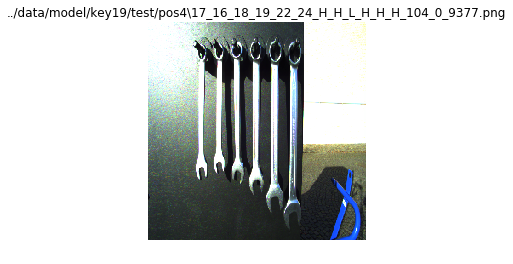

Classified as pos 3


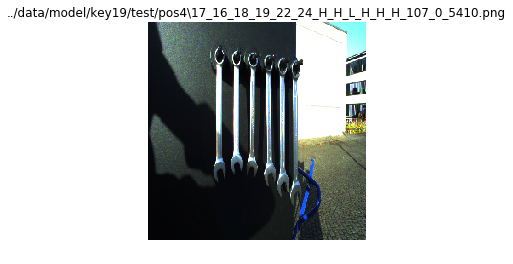

Classified as pos 2


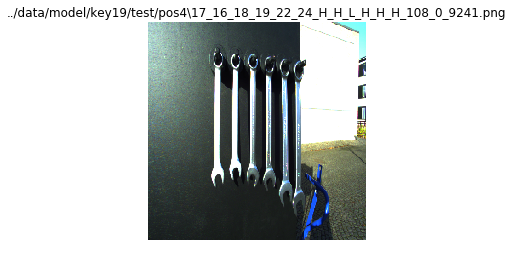

Classified as pos 6


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Classified as pos 6


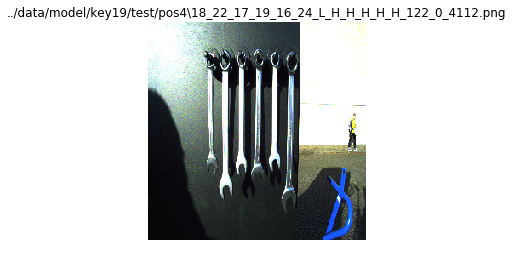

Classified as pos 6


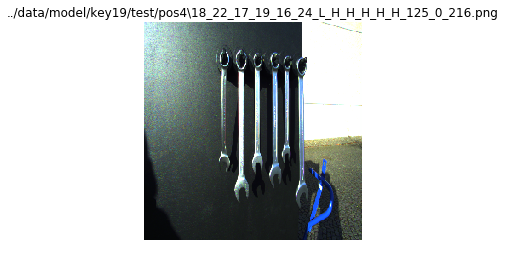

Classified as pos 2


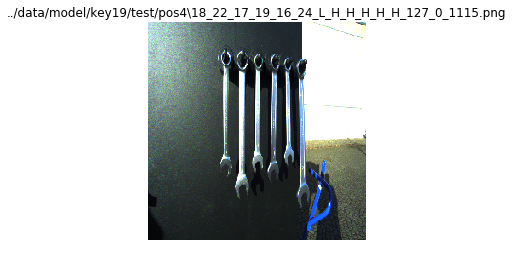

Classified as pos 5


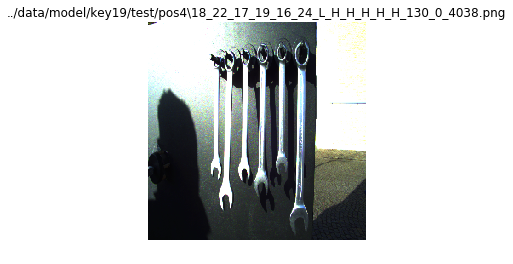

Classified as pos 2


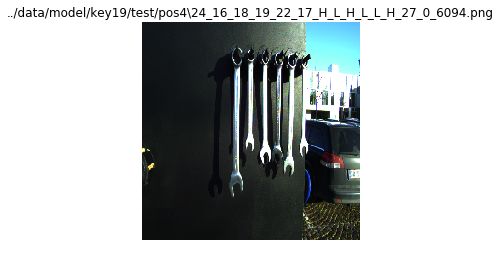

Classified as pos 2


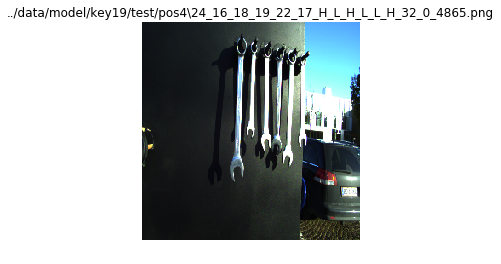

Classified as pos 5


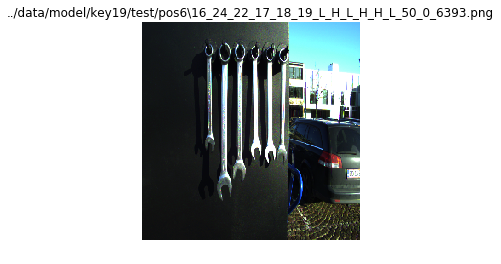

Classified as pos 2


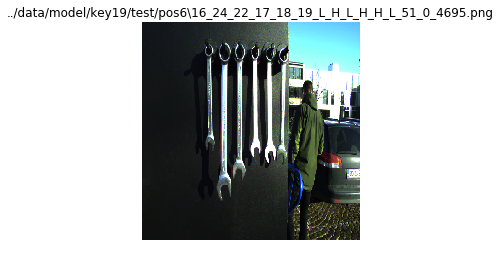

Classified as pos 5


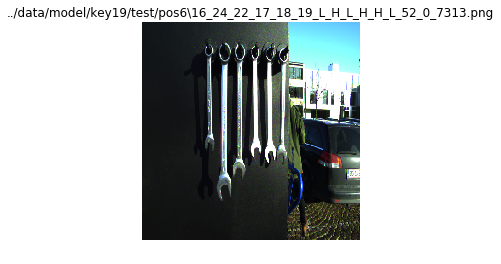

Classified as pos 5


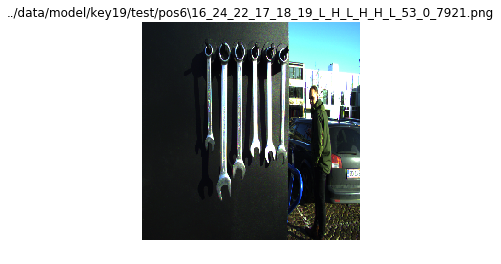

Classified as pos 5


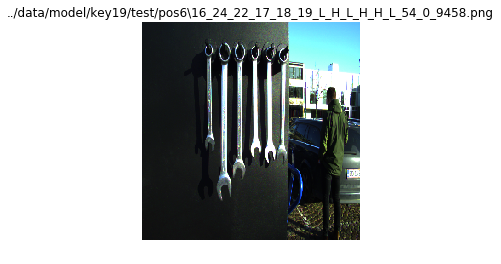

Classified as pos 2


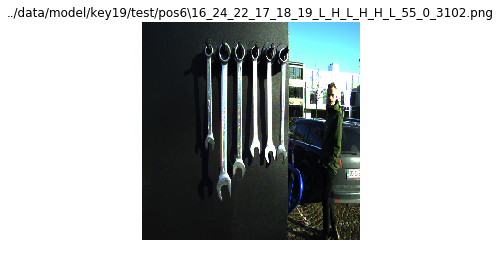

Classified as pos 4


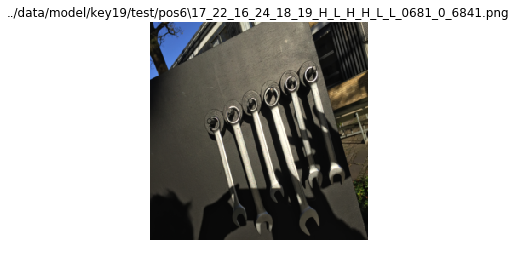

Classified as pos 5


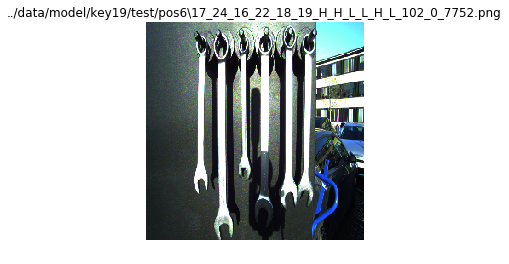

Classified as pos 2


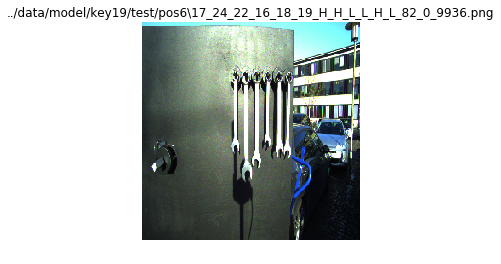

Classified as pos 2


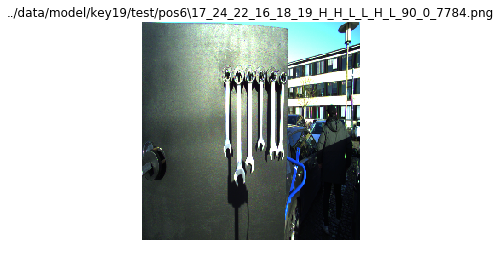

Classified as pos 1


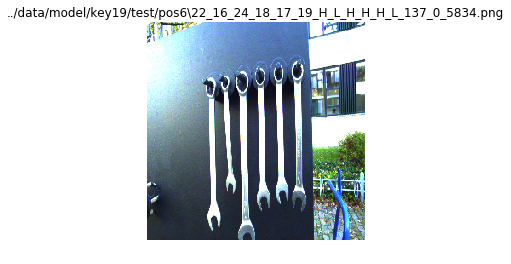

Classified as pos 1


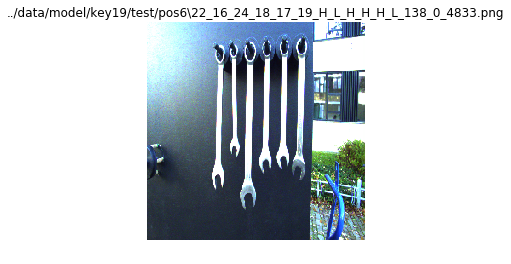

Classified as pos 1


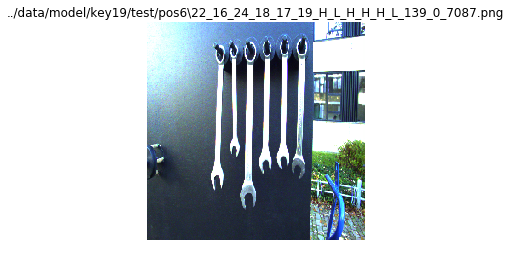

Classified as pos 2


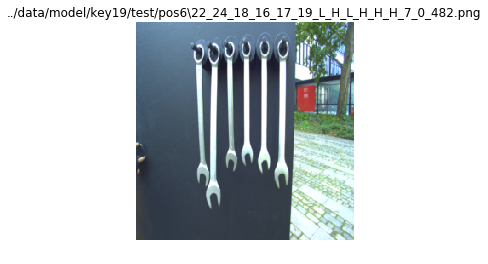

Classified as pos 2


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [79]:
idx = np.array(np.where(test_pred_labels!=test_generator.classes))
for i in range(0,idx.shape[1]):
    print('Classified as pos {}'.format(test_pred_labels[idx[0,i]]+1))
    filename = '../data/model/key19/test/'+test_generator.filenames[idx[0,i]]
    plt.figure()
    image = imread(filename)
    plt.imshow(image)
    plt.title(filename)
    plt.axis('off')
    plt.show()